In [1]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torch.optim as optim
import torchvision.datasets as datasets
import imageio
import numpy as np
import matplotlib
from torchvision.utils import make_grid, save_image
from torch.utils.data import DataLoader
from matplotlib import pyplot as plt
from tqdm import tqdm

In [2]:
#learning parameters for GAN
batch_size = 512
epochs = 200
sample_size = 64
latent_vector_size = 128 #nois3
k = 1 #steps to apply to discriminator
device = torch.device('cuda'if torch.cuda.is_available() else 'cpu')

In [3]:
#basic pytorch data downloading

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5), (0.5)),
])

to_pil_image = transforms.ToPILImage() #required when we want to save the image as a .gif

In [4]:
train_data = datasets.MNIST(root = 'data/', train=True, download=False, transform = transform)
train_loader = DataLoader(train_data,  batch_size=batch_size, shuffle=True)

In [5]:
#simple vanilla GAN with linear layers
class Generator(nn.Module):
    def __init__(self, latent_vector_size):
        super(Generator, self).__init__()
        self.latent_vector_size = latent_vector_size
        
        self.main = nn.Sequential(
            nn.Linear(self.latent_vector_size, 256),
            nn.LeakyReLU(0.2),

            nn.Linear(256, 512),
            nn.LeakyReLU(0.2),

            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2), 

            nn.Linear(1024, 784),
            nn.Tanh(),
            )
    def forward(self, x):
        return self.main(x).view(-1,1,28,28) #batchsize x 1 x 28 x 28

In [6]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.n_input = 784
        self.main = nn.Sequential(
            nn.Linear(self.n_input, 1024),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
        
            nn.Linear(1024,512),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
        
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
        
            nn.Linear(256,1),
            nn.Sigmoid(),
        )
    def forward(self, x):
        x = x.view(-1,784)
        return self.main(x)

In [7]:
gen = Generator(latent_vector_size).to(device)
dis = Discriminator().to(device)
# optimizers
optim_g = optim.Adam(gen.parameters(), lr=0.0002)
optim_d = optim.Adam(dis.parameters(), lr=0.0002)
criterion = nn.BCELoss()

losses_g = []
losses_d = []
images = []


#need noise vector to generate fake images
def create_noise(sample_size, latent_vector_size):
    return torch.randn(sample_size, latent_vector_size).to(device)

def save_generator_image(image,path):
    save_image(image,path)

noise = create_noise(sample_size, latent_vector_size)

In [8]:
def train_discriminator(optimizer, data_real, data_fake):
    b_size = data_real.size(0)

    optimizer.zero_grad()
    output_real = dis(data_real)
    loss_real = criterion(output_real, torch.ones_like(output_real))
    output_fake = dis(data_fake)
    loss_fake = criterion(output_fake, torch.zeros_like(output_fake))
    loss_real.backward()
    loss_fake.backward()
    optimizer.step()
    return loss_real + loss_fake

def train_generator(optimizer, data_fake):
    b_size = data_fake.size(0)
    optimizer.zero_grad()

    output = dis(data_fake)
    loss = criterion(output, torch.ones_like(output))

    loss.backward()
    optimizer.step()

    return loss

In [9]:
gen.train()
dis.train()

Discriminator(
  (main): Sequential(
    (0): Linear(in_features=784, out_features=1024, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.3, inplace=False)
    (3): Linear(in_features=1024, out_features=512, bias=True)
    (4): LeakyReLU(negative_slope=0.2)
    (5): Dropout(p=0.3, inplace=False)
    (6): Linear(in_features=512, out_features=256, bias=True)
    (7): LeakyReLU(negative_slope=0.2)
    (8): Dropout(p=0.3, inplace=False)
    (9): Linear(in_features=256, out_features=1, bias=True)
    (10): Sigmoid()
  )
)

118it [00:24,  4.83it/s]                         


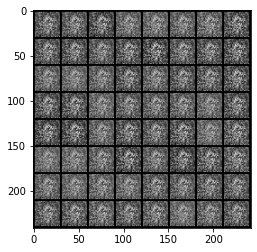

  2%|▏         | 2/117 [00:00<00:06, 19.15it/s]

Epoch 1 of 200.
Generator loss: 1.3626 
Discriminator loss: 0.9014


118it [00:05, 19.78it/s]                         


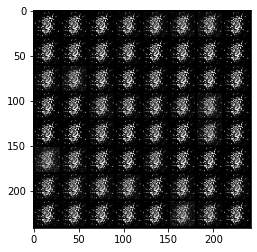

  2%|▏         | 2/117 [00:00<00:05, 19.23it/s]

Epoch 2 of 200.
Generator loss: 2.4364 
Discriminator loss: 1.2837


118it [00:05, 19.80it/s]                         


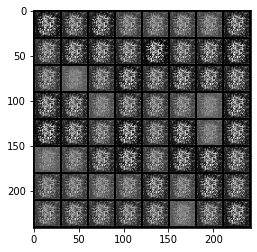

  2%|▏         | 2/117 [00:00<00:05, 19.28it/s]

Epoch 3 of 200.
Generator loss: 2.3776 
Discriminator loss: 0.8479


118it [00:06, 19.62it/s]                         


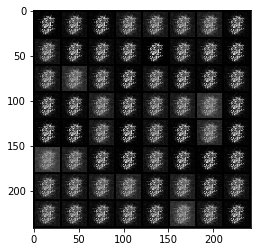

  2%|▏         | 2/117 [00:00<00:05, 19.19it/s]

Epoch 4 of 200.
Generator loss: 1.4770 
Discriminator loss: 1.2343


118it [00:05, 19.76it/s]                         


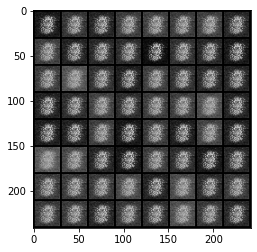

  2%|▏         | 2/117 [00:00<00:06, 19.13it/s]

Epoch 5 of 200.
Generator loss: 2.0420 
Discriminator loss: 0.9773


118it [00:06, 19.47it/s]                         


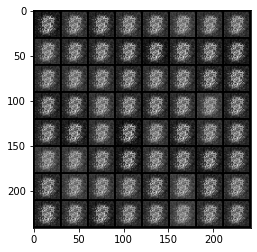

  2%|▏         | 2/117 [00:00<00:06, 19.09it/s]

Epoch 6 of 200.
Generator loss: 1.9140 
Discriminator loss: 0.9892


118it [00:06, 19.55it/s]                         


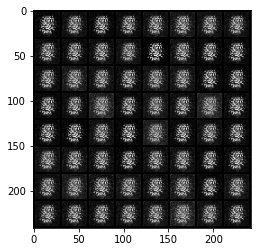

  2%|▏         | 2/117 [00:00<00:06, 19.04it/s]

Epoch 7 of 200.
Generator loss: 1.4399 
Discriminator loss: 1.2687


118it [00:05, 19.70it/s]                         


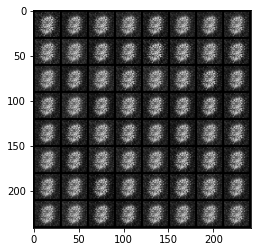

  2%|▏         | 2/117 [00:00<00:06, 19.03it/s]

Epoch 8 of 200.
Generator loss: 1.4233 
Discriminator loss: 1.1054


118it [00:06, 19.48it/s]                         


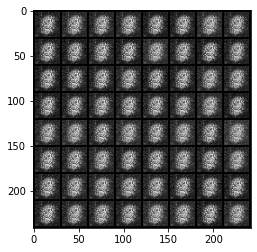

  2%|▏         | 2/117 [00:00<00:06, 18.95it/s]

Epoch 9 of 200.
Generator loss: 1.6979 
Discriminator loss: 0.9319


118it [00:06, 19.51it/s]                         


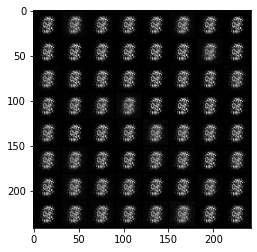

  2%|▏         | 2/117 [00:00<00:06, 19.07it/s]

Epoch 10 of 200.
Generator loss: 1.9113 
Discriminator loss: 1.4146


118it [00:06, 19.62it/s]                         


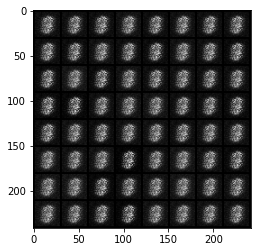

  2%|▏         | 2/117 [00:00<00:06, 19.13it/s]

Epoch 11 of 200.
Generator loss: 1.9064 
Discriminator loss: 1.3632


118it [00:06, 19.48it/s]                         


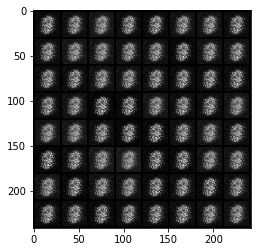

  2%|▏         | 2/117 [00:00<00:06, 19.10it/s]

Epoch 12 of 200.
Generator loss: 2.0347 
Discriminator loss: 1.0016


118it [00:06, 19.59it/s]                         


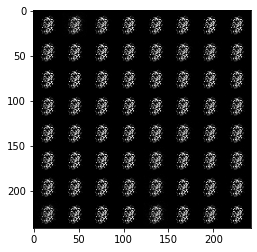

  2%|▏         | 2/117 [00:00<00:06, 19.10it/s]

Epoch 13 of 200.
Generator loss: 3.0771 
Discriminator loss: 1.5385


118it [00:05, 19.68it/s]                         


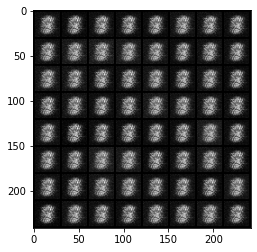

  2%|▏         | 2/117 [00:00<00:05, 19.47it/s]

Epoch 14 of 200.
Generator loss: 4.0945 
Discriminator loss: 1.0912


118it [00:05, 19.79it/s]                         


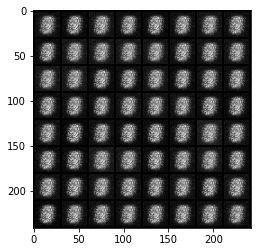

  2%|▏         | 2/117 [00:00<00:05, 19.17it/s]

Epoch 15 of 200.
Generator loss: 1.1121 
Discriminator loss: 1.1915


118it [00:06, 19.66it/s]                         


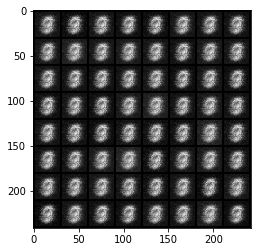

  2%|▏         | 2/117 [00:00<00:05, 19.33it/s]

Epoch 16 of 200.
Generator loss: 1.1443 
Discriminator loss: 1.2386


118it [00:05, 19.82it/s]                         


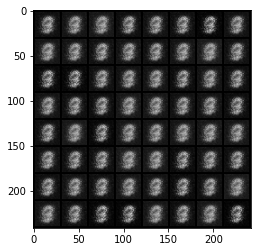

  2%|▏         | 2/117 [00:00<00:05, 19.53it/s]

Epoch 17 of 200.
Generator loss: 1.1170 
Discriminator loss: 1.0736


118it [00:05, 19.80it/s]                         


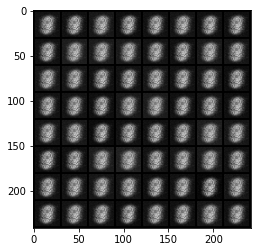

  2%|▏         | 2/117 [00:00<00:05, 19.45it/s]

Epoch 18 of 200.
Generator loss: 1.2241 
Discriminator loss: 1.1485


118it [00:06, 19.64it/s]                         


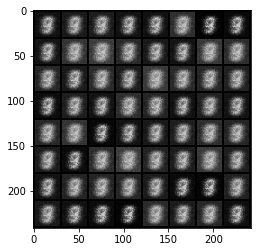

  2%|▏         | 2/117 [00:00<00:06, 19.14it/s]

Epoch 19 of 200.
Generator loss: 2.0053 
Discriminator loss: 0.6586


118it [00:05, 19.82it/s]                         


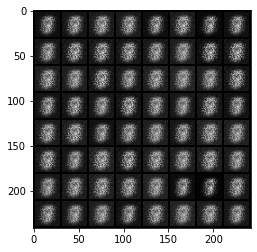

  2%|▏         | 2/117 [00:00<00:05, 19.26it/s]

Epoch 20 of 200.
Generator loss: 3.6779 
Discriminator loss: 0.6775


118it [00:05, 19.79it/s]                         


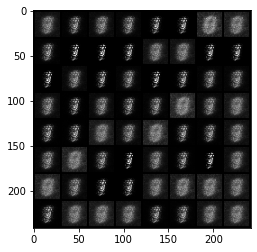

  2%|▏         | 2/117 [00:00<00:05, 19.37it/s]

Epoch 21 of 200.
Generator loss: 2.7199 
Discriminator loss: 0.7176


118it [00:05, 19.74it/s]                         


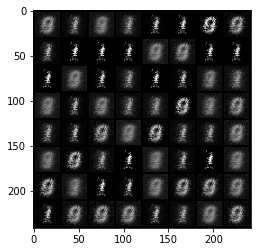

  2%|▏         | 2/117 [00:00<00:05, 19.59it/s]

Epoch 22 of 200.
Generator loss: 2.2462 
Discriminator loss: 0.8057


118it [00:05, 19.75it/s]                         


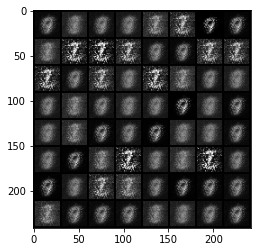

  2%|▏         | 2/117 [00:00<00:05, 19.20it/s]

Epoch 23 of 200.
Generator loss: 2.5708 
Discriminator loss: 0.5869


118it [00:05, 19.80it/s]                         


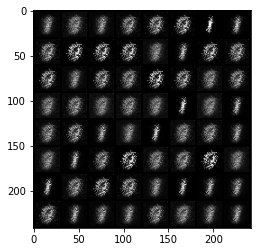

  2%|▏         | 2/117 [00:00<00:06, 19.15it/s]

Epoch 24 of 200.
Generator loss: 2.5644 
Discriminator loss: 0.7258


118it [00:06, 19.63it/s]                         


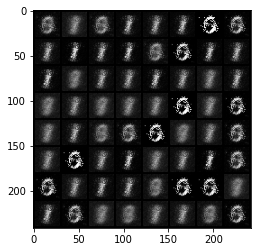

  2%|▏         | 2/117 [00:00<00:06, 19.00it/s]

Epoch 25 of 200.
Generator loss: 2.7371 
Discriminator loss: 0.7311


118it [00:06, 19.29it/s]                         


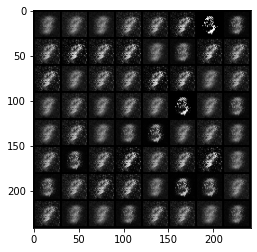

  2%|▏         | 2/117 [00:00<00:05, 19.34it/s]

Epoch 26 of 200.
Generator loss: 2.3589 
Discriminator loss: 0.6488


118it [00:05, 19.78it/s]                         


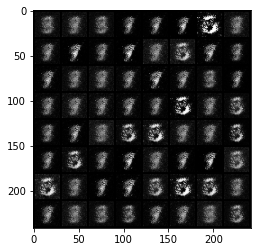

  2%|▏         | 2/117 [00:00<00:05, 19.31it/s]

Epoch 27 of 200.
Generator loss: 2.7517 
Discriminator loss: 0.4966


118it [00:06, 19.59it/s]                         


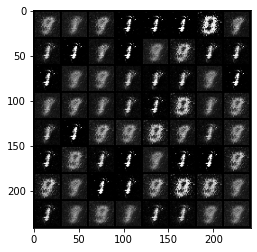

  2%|▏         | 2/117 [00:00<00:06, 19.09it/s]

Epoch 28 of 200.
Generator loss: 3.3938 
Discriminator loss: 0.4793


118it [00:05, 19.70it/s]                         


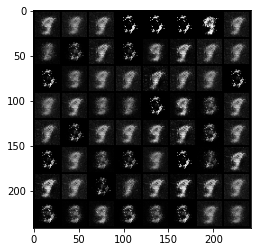

  2%|▏         | 2/117 [00:00<00:05, 19.35it/s]

Epoch 29 of 200.
Generator loss: 2.9662 
Discriminator loss: 0.5855


118it [00:05, 19.82it/s]                         


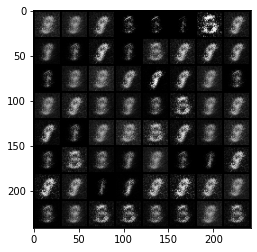

  2%|▏         | 2/117 [00:00<00:05, 19.26it/s]

Epoch 30 of 200.
Generator loss: 2.6575 
Discriminator loss: 0.5329


118it [00:05, 19.67it/s]                         


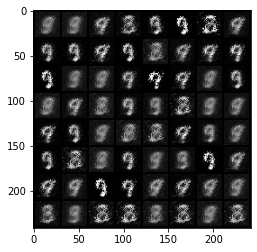

  2%|▏         | 2/117 [00:00<00:05, 19.25it/s]

Epoch 31 of 200.
Generator loss: 3.1271 
Discriminator loss: 0.4485


118it [00:05, 19.76it/s]                         


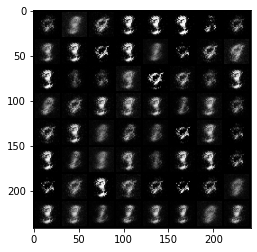

  2%|▏         | 2/117 [00:00<00:05, 19.37it/s]

Epoch 32 of 200.
Generator loss: 2.5335 
Discriminator loss: 0.7254


118it [00:05, 19.80it/s]                         


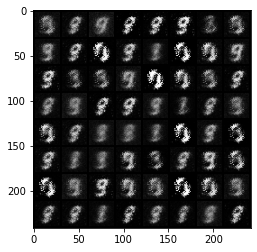

  2%|▏         | 2/117 [00:00<00:05, 19.18it/s]

Epoch 33 of 200.
Generator loss: 2.3643 
Discriminator loss: 0.6385


118it [00:06, 19.55it/s]                         


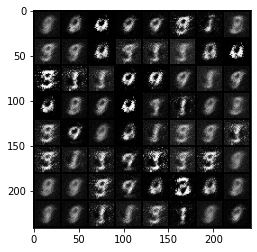

  2%|▏         | 2/117 [00:00<00:06, 18.82it/s]

Epoch 34 of 200.
Generator loss: 2.6452 
Discriminator loss: 0.5456


118it [00:05, 19.69it/s]                         


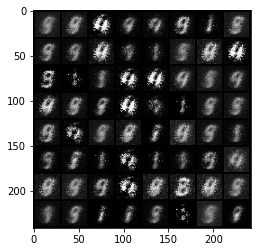

  2%|▏         | 2/117 [00:00<00:05, 19.39it/s]

Epoch 35 of 200.
Generator loss: 2.4415 
Discriminator loss: 0.5330


118it [00:05, 19.68it/s]                         


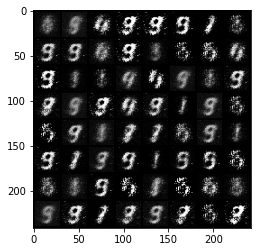

  2%|▏         | 2/117 [00:00<00:05, 19.17it/s]

Epoch 36 of 200.
Generator loss: 3.2216 
Discriminator loss: 0.4590


118it [00:06, 19.54it/s]                         


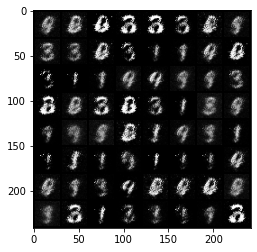

  2%|▏         | 2/117 [00:00<00:06, 19.01it/s]

Epoch 37 of 200.
Generator loss: 3.0140 
Discriminator loss: 0.5213


118it [00:05, 19.68it/s]                         


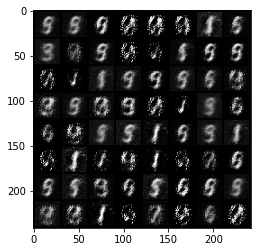

  2%|▏         | 2/117 [00:00<00:05, 19.31it/s]

Epoch 38 of 200.
Generator loss: 2.9979 
Discriminator loss: 0.4947


118it [00:05, 19.71it/s]                         


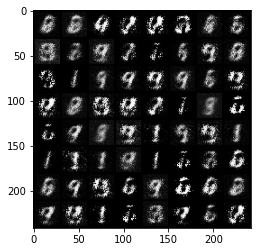

  2%|▏         | 2/117 [00:00<00:05, 19.29it/s]

Epoch 39 of 200.
Generator loss: 3.0030 
Discriminator loss: 0.4573


118it [00:06, 19.60it/s]                         


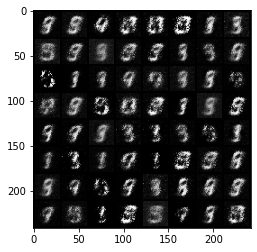

  2%|▏         | 2/117 [00:00<00:05, 19.24it/s]

Epoch 40 of 200.
Generator loss: 3.2010 
Discriminator loss: 0.5080


118it [00:05, 19.71it/s]                         


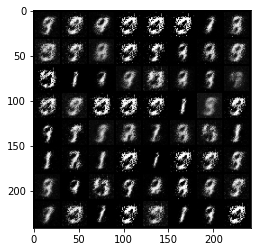

  2%|▏         | 2/117 [00:00<00:06, 19.10it/s]

Epoch 41 of 200.
Generator loss: 2.4029 
Discriminator loss: 0.7229


118it [00:05, 19.71it/s]                         


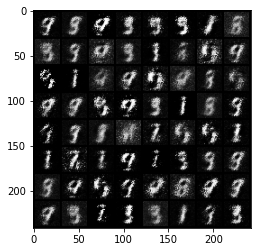

  2%|▏         | 2/117 [00:00<00:06, 19.14it/s]

Epoch 42 of 200.
Generator loss: 2.6734 
Discriminator loss: 0.5165


118it [00:06, 19.57it/s]                         


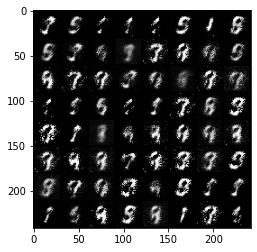

  2%|▏         | 2/117 [00:00<00:06, 19.00it/s]

Epoch 43 of 200.
Generator loss: 2.8319 
Discriminator loss: 0.5711


118it [00:06, 19.66it/s]                         


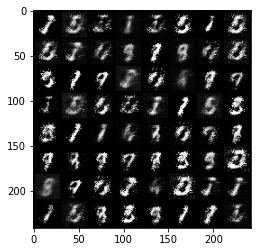

  2%|▏         | 2/117 [00:00<00:06, 18.95it/s]

Epoch 44 of 200.
Generator loss: 2.5586 
Discriminator loss: 0.5451


118it [00:06, 19.59it/s]                         


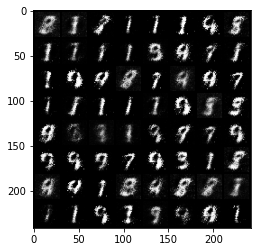

  2%|▏         | 2/117 [00:00<00:06, 18.63it/s]

Epoch 45 of 200.
Generator loss: 2.9919 
Discriminator loss: 0.4778


118it [00:06, 18.77it/s]                         


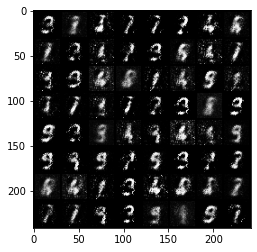

  2%|▏         | 2/117 [00:00<00:06, 19.16it/s]

Epoch 46 of 200.
Generator loss: 2.9521 
Discriminator loss: 0.5152


118it [00:06, 19.64it/s]                         


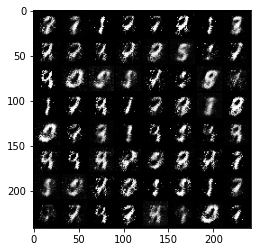

  2%|▏         | 2/117 [00:00<00:06, 19.08it/s]

Epoch 47 of 200.
Generator loss: 2.9927 
Discriminator loss: 0.5190


118it [00:06, 19.64it/s]                         


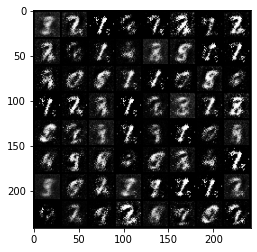

  2%|▏         | 2/117 [00:00<00:05, 19.35it/s]

Epoch 48 of 200.
Generator loss: 2.9925 
Discriminator loss: 0.4790


118it [00:06, 19.48it/s]                         


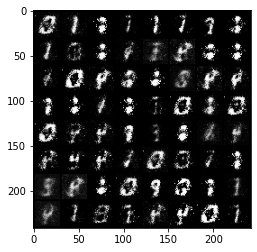

  2%|▏         | 2/117 [00:00<00:06, 18.97it/s]

Epoch 49 of 200.
Generator loss: 2.8743 
Discriminator loss: 0.5470


118it [00:06, 19.58it/s]                         


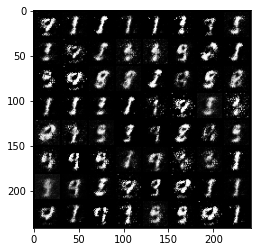

  2%|▏         | 2/117 [00:00<00:05, 19.18it/s]

Epoch 50 of 200.
Generator loss: 2.7724 
Discriminator loss: 0.5449


118it [00:06, 19.61it/s]                         


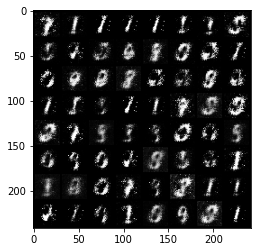

  2%|▏         | 2/117 [00:00<00:06, 19.05it/s]

Epoch 51 of 200.
Generator loss: 3.0430 
Discriminator loss: 0.4878


118it [00:06, 19.42it/s]                         


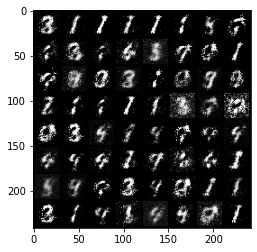

  2%|▏         | 2/117 [00:00<00:06, 18.87it/s]

Epoch 52 of 200.
Generator loss: 2.9524 
Discriminator loss: 0.4759


118it [00:06, 19.61it/s]                         


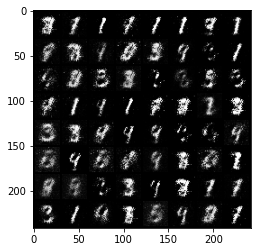

  2%|▏         | 2/117 [00:00<00:05, 19.31it/s]

Epoch 53 of 200.
Generator loss: 2.5543 
Discriminator loss: 0.6936


118it [00:06, 19.62it/s]                         


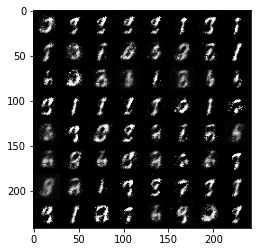

  2%|▏         | 2/117 [00:00<00:06, 19.06it/s]

Epoch 54 of 200.
Generator loss: 2.4764 
Discriminator loss: 0.6587


118it [00:06, 18.46it/s]                         


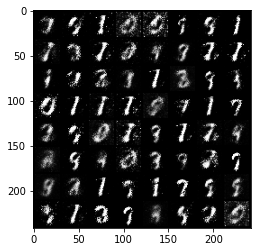

  2%|▏         | 2/117 [00:00<00:06, 17.11it/s]

Epoch 55 of 200.
Generator loss: 2.2453 
Discriminator loss: 0.6377


118it [00:06, 17.46it/s]                         


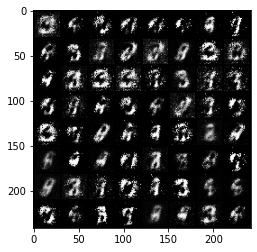

  2%|▏         | 2/117 [00:00<00:06, 18.94it/s]

Epoch 56 of 200.
Generator loss: 2.3032 
Discriminator loss: 0.6789


118it [00:06, 19.52it/s]                         


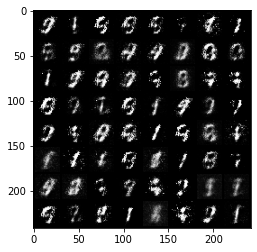

  2%|▏         | 2/117 [00:00<00:06, 19.00it/s]

Epoch 57 of 200.
Generator loss: 2.3793 
Discriminator loss: 0.6691


118it [00:06, 19.30it/s]                         


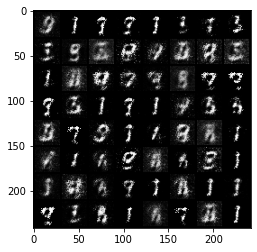

  2%|▏         | 2/117 [00:00<00:06, 18.94it/s]

Epoch 58 of 200.
Generator loss: 2.4382 
Discriminator loss: 0.6418


118it [00:06, 19.46it/s]                         


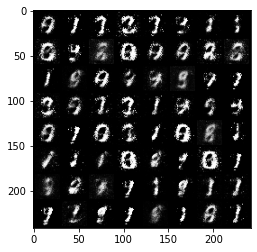

  2%|▏         | 2/117 [00:00<00:06, 18.93it/s]

Epoch 59 of 200.
Generator loss: 2.3503 
Discriminator loss: 0.6326


118it [00:06, 19.56it/s]                         


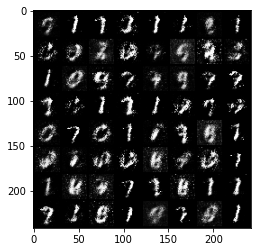

  2%|▏         | 2/117 [00:00<00:06, 18.83it/s]

Epoch 60 of 200.
Generator loss: 2.3967 
Discriminator loss: 0.6460


118it [00:06, 19.46it/s]                         


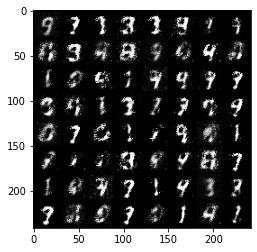

  2%|▏         | 2/117 [00:00<00:06, 19.00it/s]

Epoch 61 of 200.
Generator loss: 2.4035 
Discriminator loss: 0.6767


118it [00:06, 19.61it/s]                         


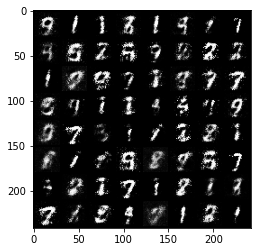

  2%|▏         | 2/117 [00:00<00:06, 18.90it/s]

Epoch 62 of 200.
Generator loss: 2.2560 
Discriminator loss: 0.7029


118it [00:06, 19.61it/s]                         


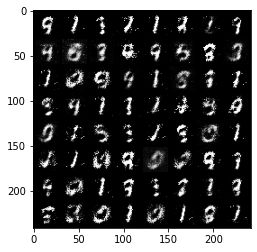

  2%|▏         | 2/117 [00:00<00:06, 19.07it/s]

Epoch 63 of 200.
Generator loss: 2.2257 
Discriminator loss: 0.7244


118it [00:06, 19.32it/s]                         


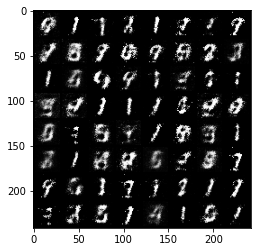

  2%|▏         | 2/117 [00:00<00:06, 18.89it/s]

Epoch 64 of 200.
Generator loss: 2.4003 
Discriminator loss: 0.6739


118it [00:06, 18.60it/s]                         


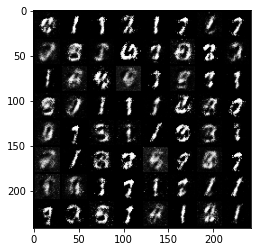

  2%|▏         | 2/117 [00:00<00:06, 18.88it/s]

Epoch 65 of 200.
Generator loss: 2.3338 
Discriminator loss: 0.6683


118it [00:06, 19.58it/s]                         


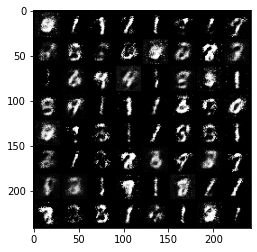

  2%|▏         | 2/117 [00:00<00:06, 18.99it/s]

Epoch 66 of 200.
Generator loss: 2.2058 
Discriminator loss: 0.6949


118it [00:06, 19.22it/s]                         


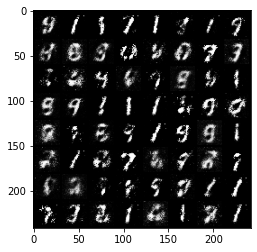

  2%|▏         | 2/117 [00:00<00:06, 19.06it/s]

Epoch 67 of 200.
Generator loss: 2.1406 
Discriminator loss: 0.7233


118it [00:06, 19.48it/s]                         


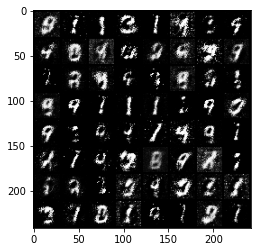

  2%|▏         | 2/117 [00:00<00:06, 18.99it/s]

Epoch 68 of 200.
Generator loss: 2.1991 
Discriminator loss: 0.6929


118it [00:06, 19.54it/s]                         


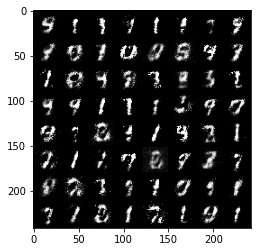

  2%|▏         | 2/117 [00:00<00:06, 18.85it/s]

Epoch 69 of 200.
Generator loss: 2.1639 
Discriminator loss: 0.7910


118it [00:06, 19.19it/s]                         


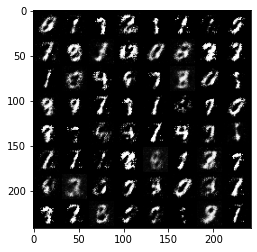

  2%|▏         | 2/117 [00:00<00:06, 18.94it/s]

Epoch 70 of 200.
Generator loss: 2.2110 
Discriminator loss: 0.7360


118it [00:06, 19.51it/s]                         


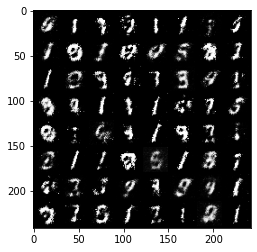

  2%|▏         | 2/117 [00:00<00:06, 18.95it/s]

Epoch 71 of 200.
Generator loss: 2.1043 
Discriminator loss: 0.6968


118it [00:06, 19.54it/s]                         


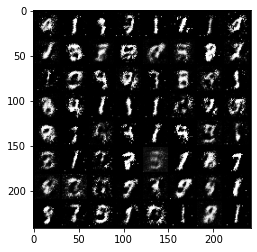

  2%|▏         | 2/117 [00:00<00:06, 18.90it/s]

Epoch 72 of 200.
Generator loss: 2.1162 
Discriminator loss: 0.7171


118it [00:06, 19.26it/s]                         


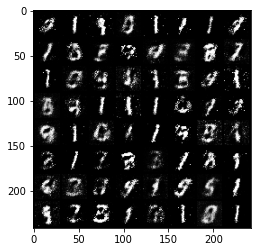

  2%|▏         | 2/117 [00:00<00:06, 19.04it/s]

Epoch 73 of 200.
Generator loss: 2.0506 
Discriminator loss: 0.7947


118it [00:06, 19.54it/s]                         


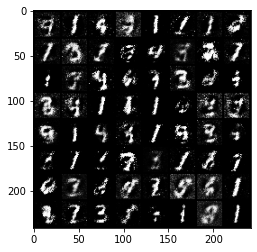

  2%|▏         | 2/117 [00:00<00:06, 18.79it/s]

Epoch 74 of 200.
Generator loss: 2.0520 
Discriminator loss: 0.7989


118it [00:06, 19.49it/s]                         


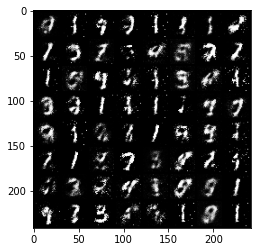

  2%|▏         | 2/117 [00:00<00:06, 18.96it/s]

Epoch 75 of 200.
Generator loss: 1.9770 
Discriminator loss: 0.7763


118it [00:06, 19.32it/s]                         


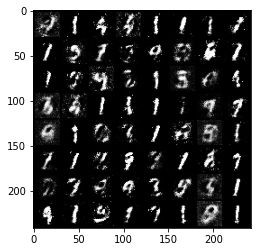

  2%|▏         | 2/117 [00:00<00:06, 18.92it/s]

Epoch 76 of 200.
Generator loss: 2.0714 
Discriminator loss: 0.7079


118it [00:06, 19.42it/s]                         


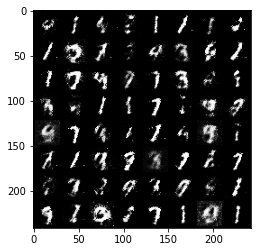

  2%|▏         | 2/117 [00:00<00:06, 18.69it/s]

Epoch 77 of 200.
Generator loss: 2.1937 
Discriminator loss: 0.6997


118it [00:06, 19.48it/s]                         


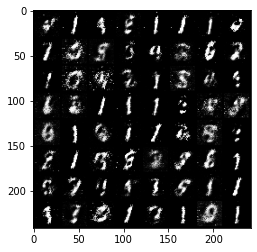

  2%|▏         | 2/117 [00:00<00:06, 18.85it/s]

Epoch 78 of 200.
Generator loss: 2.1375 
Discriminator loss: 0.7780


118it [00:06, 19.35it/s]                         


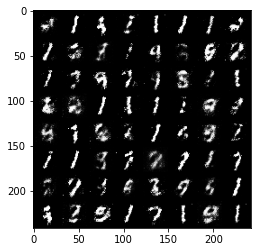

  2%|▏         | 2/117 [00:00<00:06, 18.83it/s]

Epoch 79 of 200.
Generator loss: 2.0829 
Discriminator loss: 0.7593


118it [00:06, 19.51it/s]                         


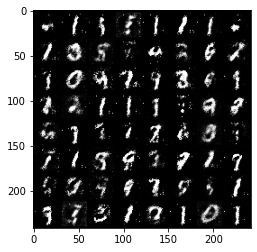

  2%|▏         | 2/117 [00:00<00:06, 19.00it/s]

Epoch 80 of 200.
Generator loss: 2.0164 
Discriminator loss: 0.7499


118it [00:06, 19.54it/s]                         


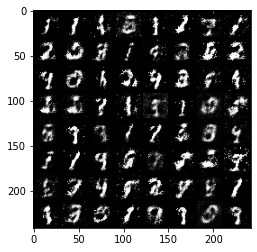

  2%|▏         | 2/117 [00:00<00:06, 19.03it/s]

Epoch 81 of 200.
Generator loss: 2.1423 
Discriminator loss: 0.7434


118it [00:06, 19.53it/s]                         


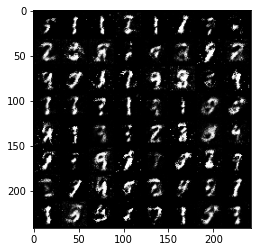

  2%|▏         | 2/117 [00:00<00:06, 18.94it/s]

Epoch 82 of 200.
Generator loss: 2.0248 
Discriminator loss: 0.7822


118it [00:06, 19.59it/s]                         


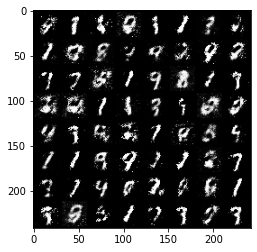

  2%|▏         | 2/117 [00:00<00:06, 18.78it/s]

Epoch 83 of 200.
Generator loss: 2.0709 
Discriminator loss: 0.7669


118it [00:06, 19.39it/s]                         


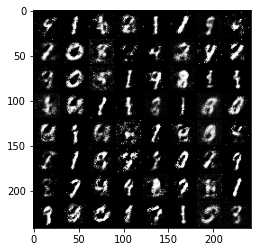

  2%|▏         | 2/117 [00:00<00:06, 18.53it/s]

Epoch 84 of 200.
Generator loss: 2.1033 
Discriminator loss: 0.7448


118it [00:06, 18.36it/s]                         


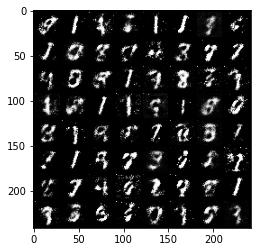

  2%|▏         | 2/117 [00:00<00:06, 18.66it/s]

Epoch 85 of 200.
Generator loss: 2.0985 
Discriminator loss: 0.7887


118it [00:06, 19.36it/s]                         


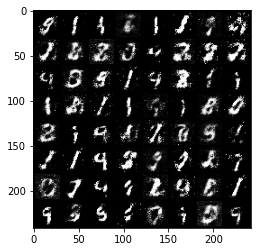

  2%|▏         | 2/117 [00:00<00:06, 18.88it/s]

Epoch 86 of 200.
Generator loss: 2.1412 
Discriminator loss: 0.7574


118it [00:06, 19.45it/s]                         


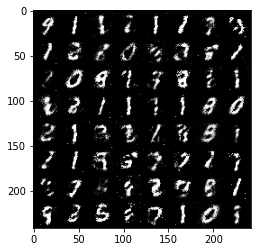

  2%|▏         | 2/117 [00:00<00:06, 18.99it/s]

Epoch 87 of 200.
Generator loss: 1.9832 
Discriminator loss: 0.7778


118it [00:06, 19.48it/s]                         


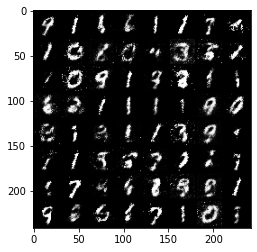

  2%|▏         | 2/117 [00:00<00:06, 18.77it/s]

Epoch 88 of 200.
Generator loss: 2.1137 
Discriminator loss: 0.7338


118it [00:06, 19.31it/s]                         


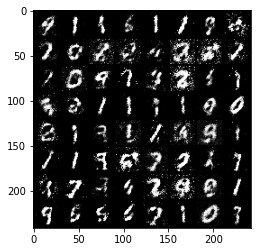

  2%|▏         | 2/117 [00:00<00:06, 18.94it/s]

Epoch 89 of 200.
Generator loss: 2.2366 
Discriminator loss: 0.7109


118it [00:06, 19.44it/s]                         


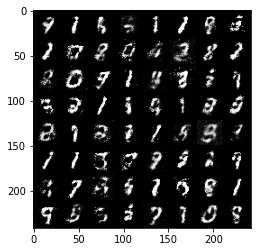

  2%|▏         | 2/117 [00:00<00:06, 18.79it/s]

Epoch 90 of 200.
Generator loss: 2.0982 
Discriminator loss: 0.8002


118it [00:06, 19.40it/s]                         


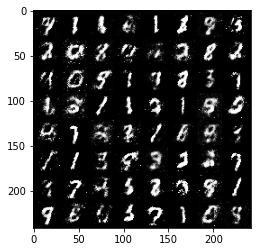

  2%|▏         | 2/117 [00:00<00:06, 18.97it/s]

Epoch 91 of 200.
Generator loss: 1.9763 
Discriminator loss: 0.7981


118it [00:06, 19.32it/s]                         


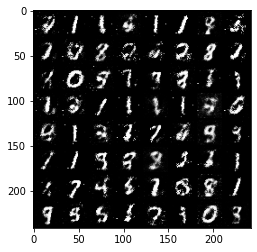

  2%|▏         | 2/117 [00:00<00:06, 18.72it/s]

Epoch 92 of 200.
Generator loss: 1.8702 
Discriminator loss: 0.8144


118it [00:06, 19.47it/s]                         


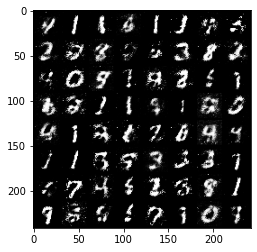

  2%|▏         | 2/117 [00:00<00:06, 18.73it/s]

Epoch 93 of 200.
Generator loss: 1.9689 
Discriminator loss: 0.8115


118it [00:06, 19.48it/s]                         


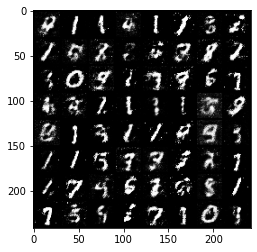

  2%|▏         | 2/117 [00:00<00:06, 18.92it/s]

Epoch 94 of 200.
Generator loss: 1.9240 
Discriminator loss: 0.8203


118it [00:06, 19.35it/s]                         


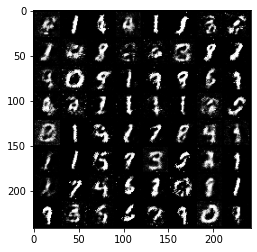

  2%|▏         | 2/117 [00:00<00:06, 18.95it/s]

Epoch 95 of 200.
Generator loss: 1.8285 
Discriminator loss: 0.8428


118it [00:06, 19.47it/s]                         


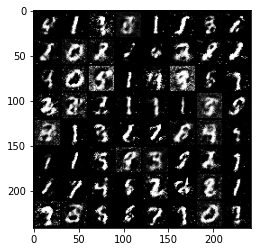

  2%|▏         | 2/117 [00:00<00:06, 18.80it/s]

Epoch 96 of 200.
Generator loss: 1.9443 
Discriminator loss: 0.7940


118it [00:06, 19.47it/s]                         


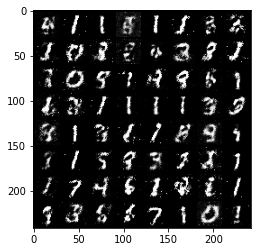

  2%|▏         | 2/117 [00:00<00:06, 18.95it/s]

Epoch 97 of 200.
Generator loss: 1.8591 
Discriminator loss: 0.8476


118it [00:06, 19.34it/s]                         


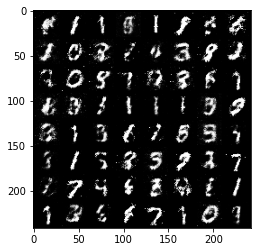

  2%|▏         | 2/117 [00:00<00:06, 18.96it/s]

Epoch 98 of 200.
Generator loss: 1.7400 
Discriminator loss: 0.8707


118it [00:06, 19.50it/s]                         


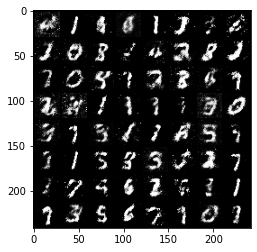

  2%|▏         | 2/117 [00:00<00:06, 19.03it/s]

Epoch 99 of 200.
Generator loss: 1.8220 
Discriminator loss: 0.8432


118it [00:06, 19.48it/s]                         


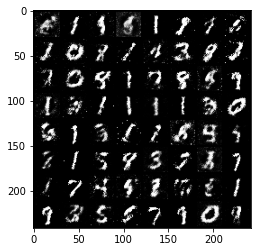

  2%|▏         | 2/117 [00:00<00:06, 18.82it/s]

Epoch 100 of 200.
Generator loss: 1.9639 
Discriminator loss: 0.8010


118it [00:06, 19.44it/s]                         


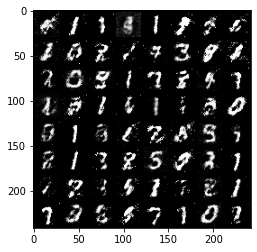

  2%|▏         | 2/117 [00:00<00:06, 18.73it/s]

Epoch 101 of 200.
Generator loss: 1.7996 
Discriminator loss: 0.8500


118it [00:06, 19.45it/s]                         


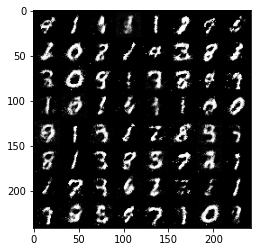

  2%|▏         | 2/117 [00:00<00:06, 18.82it/s]

Epoch 102 of 200.
Generator loss: 1.9133 
Discriminator loss: 0.8187


118it [00:06, 19.41it/s]                         


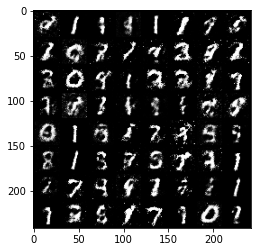

  2%|▏         | 2/117 [00:00<00:06, 19.00it/s]

Epoch 103 of 200.
Generator loss: 1.9262 
Discriminator loss: 0.8178


118it [00:06, 17.95it/s]                         


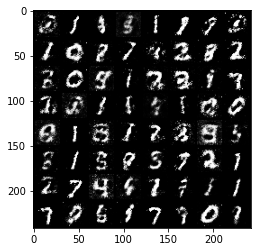

  2%|▏         | 2/117 [00:00<00:06, 18.94it/s]

Epoch 104 of 200.
Generator loss: 1.8368 
Discriminator loss: 0.8718


118it [00:06, 19.41it/s]                         


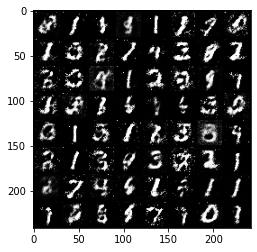

  2%|▏         | 2/117 [00:00<00:06, 18.97it/s]

Epoch 105 of 200.
Generator loss: 1.7685 
Discriminator loss: 0.9016


118it [00:06, 19.36it/s]                         


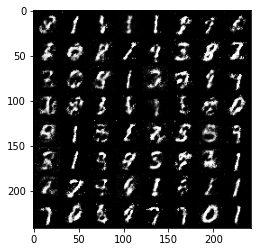

  2%|▏         | 2/117 [00:00<00:06, 18.72it/s]

Epoch 106 of 200.
Generator loss: 1.8155 
Discriminator loss: 0.8362


118it [00:06, 19.31it/s]                         


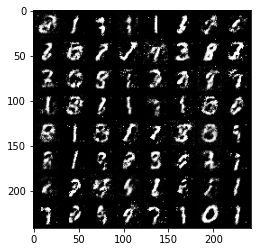

  2%|▏         | 2/117 [00:00<00:06, 18.71it/s]

Epoch 107 of 200.
Generator loss: 1.8200 
Discriminator loss: 0.8615


118it [00:06, 19.36it/s]                         


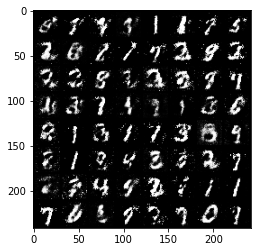

  2%|▏         | 2/117 [00:00<00:06, 18.87it/s]

Epoch 108 of 200.
Generator loss: 1.8256 
Discriminator loss: 0.8850


118it [00:06, 19.48it/s]                         


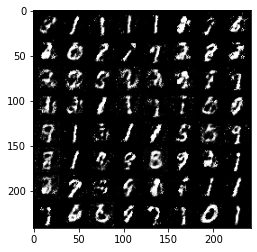

  2%|▏         | 2/117 [00:00<00:06, 18.56it/s]

Epoch 109 of 200.
Generator loss: 1.7836 
Discriminator loss: 0.8509


118it [00:06, 19.28it/s]                         


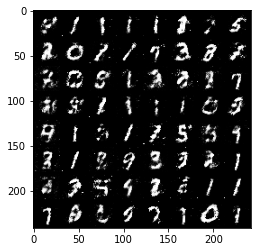

  2%|▏         | 2/117 [00:00<00:06, 18.32it/s]

Epoch 110 of 200.
Generator loss: 1.8966 
Discriminator loss: 0.8096


118it [00:06, 19.33it/s]                         


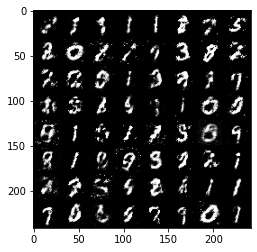

  2%|▏         | 2/117 [00:00<00:06, 18.68it/s]

Epoch 111 of 200.
Generator loss: 1.7391 
Discriminator loss: 0.8909


118it [00:06, 19.39it/s]                         


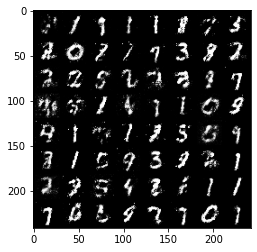

  2%|▏         | 2/117 [00:00<00:06, 18.63it/s]

Epoch 112 of 200.
Generator loss: 1.7921 
Discriminator loss: 0.8724


118it [00:06, 19.21it/s]                         


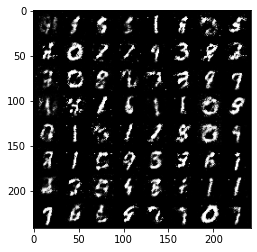

  2%|▏         | 2/117 [00:00<00:06, 18.53it/s]

Epoch 113 of 200.
Generator loss: 1.7686 
Discriminator loss: 0.8928


118it [00:06, 19.33it/s]                         


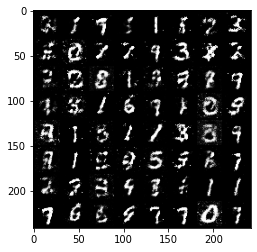

  2%|▏         | 2/117 [00:00<00:06, 17.99it/s]

Epoch 114 of 200.
Generator loss: 1.6939 
Discriminator loss: 0.9163


118it [00:06, 19.07it/s]                         


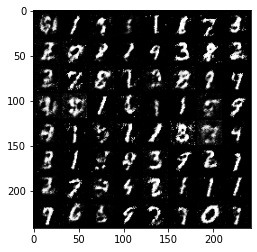

  2%|▏         | 2/117 [00:00<00:08, 14.26it/s]

Epoch 115 of 200.
Generator loss: 1.6911 
Discriminator loss: 0.8951


118it [00:06, 18.52it/s]                         


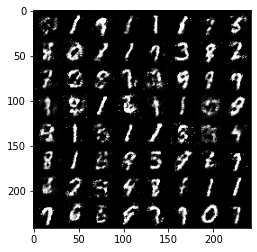

  2%|▏         | 2/117 [00:00<00:06, 18.62it/s]

Epoch 116 of 200.
Generator loss: 1.7251 
Discriminator loss: 0.8812


118it [00:06, 19.43it/s]                         


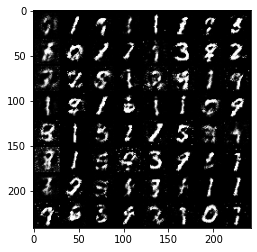

  2%|▏         | 2/117 [00:00<00:06, 18.81it/s]

Epoch 117 of 200.
Generator loss: 1.7279 
Discriminator loss: 0.8737


118it [00:06, 19.53it/s]                         


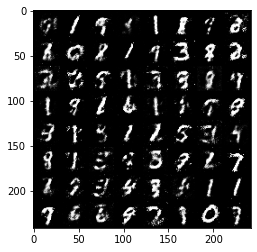

  2%|▏         | 2/117 [00:00<00:06, 18.73it/s]

Epoch 118 of 200.
Generator loss: 1.7248 
Discriminator loss: 0.8972


118it [00:06, 19.37it/s]                         


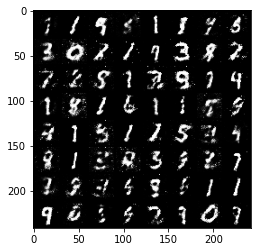

  2%|▏         | 2/117 [00:00<00:06, 18.70it/s]

Epoch 119 of 200.
Generator loss: 1.6862 
Discriminator loss: 0.9070


118it [00:06, 19.46it/s]                         


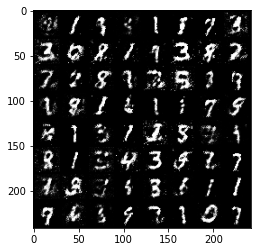

  2%|▏         | 2/117 [00:00<00:06, 18.53it/s]

Epoch 120 of 200.
Generator loss: 1.6565 
Discriminator loss: 0.9033


118it [00:06, 19.47it/s]                         


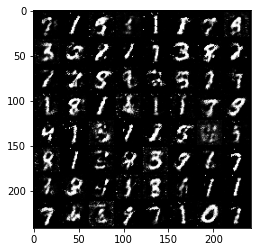

  2%|▏         | 2/117 [00:00<00:06, 18.73it/s]

Epoch 121 of 200.
Generator loss: 1.6115 
Discriminator loss: 0.9108


118it [00:06, 19.23it/s]                         


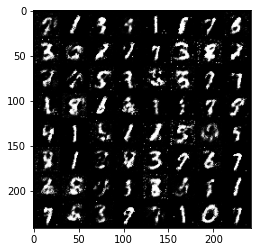

  2%|▏         | 2/117 [00:00<00:06, 18.78it/s]

Epoch 122 of 200.
Generator loss: 1.8091 
Discriminator loss: 0.8836


118it [00:06, 19.24it/s]                         


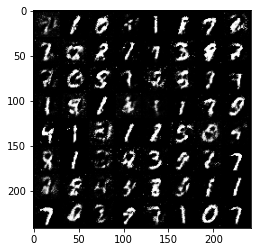

  2%|▏         | 2/117 [00:00<00:06, 18.22it/s]

Epoch 123 of 200.
Generator loss: 1.6695 
Discriminator loss: 0.9152


118it [00:06, 18.00it/s]                         


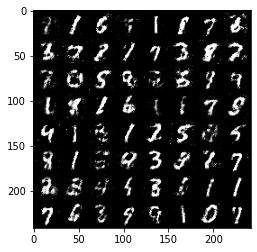

  2%|▏         | 2/117 [00:00<00:06, 18.65it/s]

Epoch 124 of 200.
Generator loss: 1.6848 
Discriminator loss: 0.9028


118it [00:06, 19.30it/s]                         


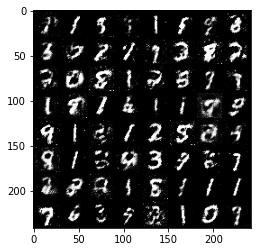

  2%|▏         | 2/117 [00:00<00:06, 18.85it/s]

Epoch 125 of 200.
Generator loss: 1.7336 
Discriminator loss: 0.8922


118it [00:06, 19.37it/s]                         


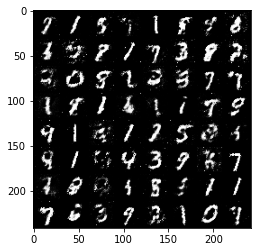

  2%|▏         | 2/117 [00:00<00:06, 18.64it/s]

Epoch 126 of 200.
Generator loss: 1.6939 
Discriminator loss: 0.8922


118it [00:06, 19.40it/s]                         


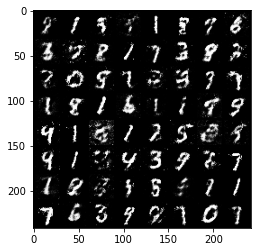

  2%|▏         | 2/117 [00:00<00:06, 18.52it/s]

Epoch 127 of 200.
Generator loss: 1.7099 
Discriminator loss: 0.8830


118it [00:06, 19.34it/s]                         


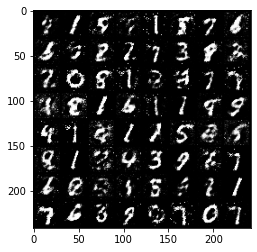

  2%|▏         | 2/117 [00:00<00:06, 18.35it/s]

Epoch 128 of 200.
Generator loss: 1.6633 
Discriminator loss: 0.9156


118it [00:06, 19.37it/s]                         


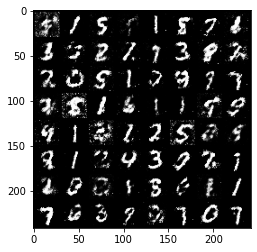

  2%|▏         | 2/117 [00:00<00:06, 18.61it/s]

Epoch 129 of 200.
Generator loss: 1.6067 
Discriminator loss: 0.9343


118it [00:06, 19.39it/s]                         


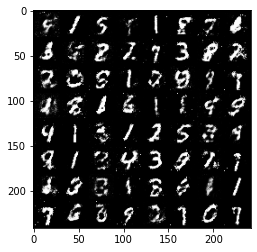

  2%|▏         | 2/117 [00:00<00:06, 18.63it/s]

Epoch 130 of 200.
Generator loss: 1.5734 
Discriminator loss: 0.9371


118it [00:06, 19.43it/s]                         


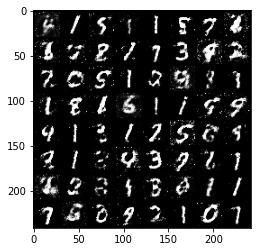

  2%|▏         | 2/117 [00:00<00:06, 18.73it/s]

Epoch 131 of 200.
Generator loss: 1.6197 
Discriminator loss: 0.9380


118it [00:06, 19.06it/s]                         


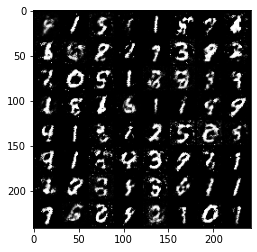

  2%|▏         | 2/117 [00:00<00:06, 18.54it/s]

Epoch 132 of 200.
Generator loss: 1.6013 
Discriminator loss: 0.9532


118it [00:06, 19.41it/s]                         


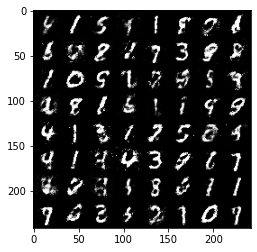

  2%|▏         | 2/117 [00:00<00:06, 18.55it/s]

Epoch 133 of 200.
Generator loss: 1.6288 
Discriminator loss: 0.9116


118it [00:06, 19.39it/s]                         


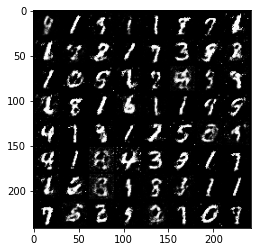

  2%|▏         | 2/117 [00:00<00:06, 18.55it/s]

Epoch 134 of 200.
Generator loss: 1.6029 
Discriminator loss: 0.9448


118it [00:06, 19.16it/s]                         


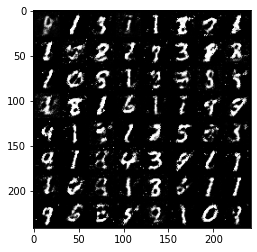

  2%|▏         | 2/117 [00:00<00:06, 18.39it/s]

Epoch 135 of 200.
Generator loss: 1.5843 
Discriminator loss: 0.9460


118it [00:06, 19.31it/s]                         


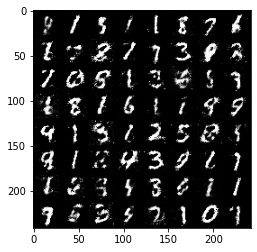

  2%|▏         | 2/117 [00:00<00:06, 18.72it/s]

Epoch 136 of 200.
Generator loss: 1.6072 
Discriminator loss: 0.9416


118it [00:06, 19.33it/s]                         


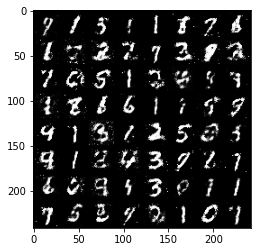

  2%|▏         | 2/117 [00:00<00:06, 18.63it/s]

Epoch 137 of 200.
Generator loss: 1.5604 
Discriminator loss: 0.9489


118it [00:06, 19.18it/s]                         


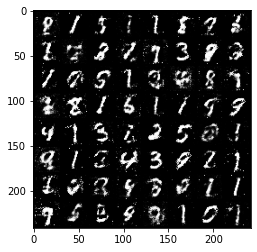

  2%|▏         | 2/117 [00:00<00:06, 18.62it/s]

Epoch 138 of 200.
Generator loss: 1.5191 
Discriminator loss: 0.9696


118it [00:06, 19.29it/s]                         


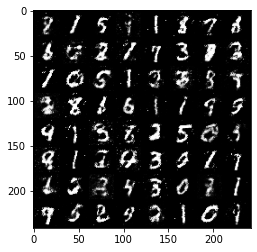

  2%|▏         | 2/117 [00:00<00:06, 18.50it/s]

Epoch 139 of 200.
Generator loss: 1.5927 
Discriminator loss: 0.9492


118it [00:06, 19.30it/s]                         


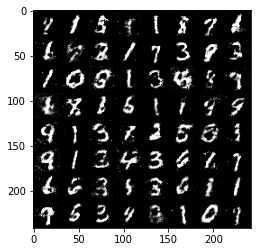

  2%|▏         | 2/117 [00:00<00:06, 18.47it/s]

Epoch 140 of 200.
Generator loss: 1.5774 
Discriminator loss: 0.9452


118it [00:06, 19.28it/s]                         


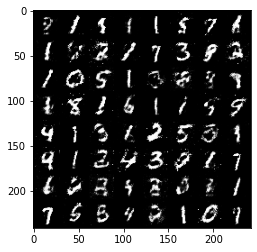

  2%|▏         | 2/117 [00:00<00:06, 18.52it/s]

Epoch 141 of 200.
Generator loss: 1.5626 
Discriminator loss: 0.9470


118it [00:06, 19.32it/s]                         


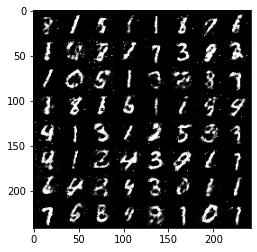

  2%|▏         | 2/117 [00:00<00:06, 18.11it/s]

Epoch 142 of 200.
Generator loss: 1.5390 
Discriminator loss: 0.9529


118it [00:06, 17.56it/s]                         


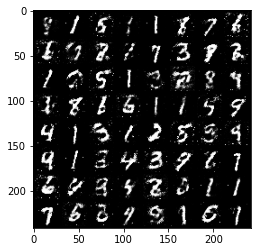

  2%|▏         | 2/117 [00:00<00:06, 18.44it/s]

Epoch 143 of 200.
Generator loss: 1.5707 
Discriminator loss: 0.9351


118it [00:06, 19.28it/s]                         


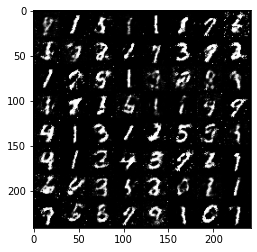

  2%|▏         | 2/117 [00:00<00:06, 18.45it/s]

Epoch 144 of 200.
Generator loss: 1.6038 
Discriminator loss: 0.9334


118it [00:06, 19.32it/s]                         


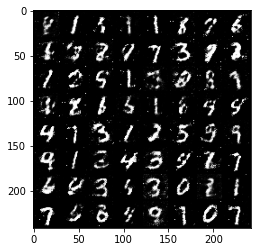

  2%|▏         | 2/117 [00:00<00:06, 18.58it/s]

Epoch 145 of 200.
Generator loss: 1.5285 
Discriminator loss: 1.0011


118it [00:06, 19.36it/s]                         


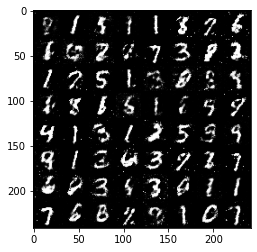

  2%|▏         | 2/117 [00:00<00:06, 18.51it/s]

Epoch 146 of 200.
Generator loss: 1.4485 
Discriminator loss: 1.0065


118it [00:06, 19.23it/s]                         


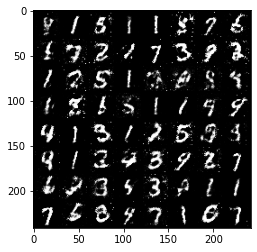

  2%|▏         | 2/117 [00:00<00:06, 18.48it/s]

Epoch 147 of 200.
Generator loss: 1.5377 
Discriminator loss: 0.9507


118it [00:06, 19.37it/s]                         


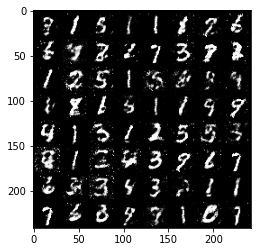

  2%|▏         | 2/117 [00:00<00:06, 18.41it/s]

Epoch 148 of 200.
Generator loss: 1.4982 
Discriminator loss: 0.9786


118it [00:06, 19.34it/s]                         


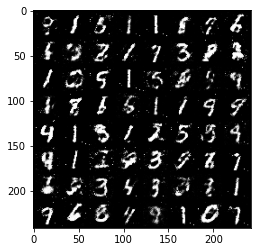

  2%|▏         | 2/117 [00:00<00:06, 18.45it/s]

Epoch 149 of 200.
Generator loss: 1.5654 
Discriminator loss: 0.9412


118it [00:06, 19.14it/s]                         


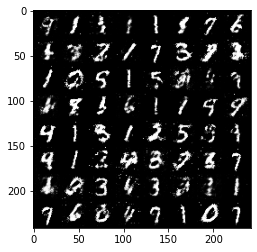

  2%|▏         | 2/117 [00:00<00:06, 18.55it/s]

Epoch 150 of 200.
Generator loss: 1.5492 
Discriminator loss: 0.9367


118it [00:06, 19.35it/s]                         


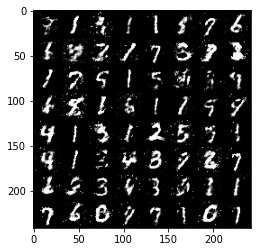

  2%|▏         | 2/117 [00:00<00:06, 18.67it/s]

Epoch 151 of 200.
Generator loss: 1.5613 
Discriminator loss: 0.9589


118it [00:06, 19.31it/s]                         


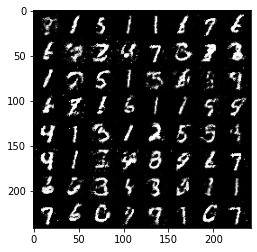

  2%|▏         | 2/117 [00:00<00:06, 18.57it/s]

Epoch 152 of 200.
Generator loss: 1.5322 
Discriminator loss: 0.9481


118it [00:06, 19.14it/s]                         


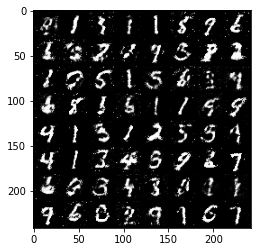

  2%|▏         | 2/117 [00:00<00:06, 18.52it/s]

Epoch 153 of 200.
Generator loss: 1.5395 
Discriminator loss: 0.9794


118it [00:06, 19.26it/s]                         


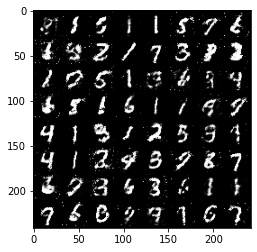

  2%|▏         | 2/117 [00:00<00:06, 18.46it/s]

Epoch 154 of 200.
Generator loss: 1.5203 
Discriminator loss: 0.9757


118it [00:06, 19.28it/s]                         


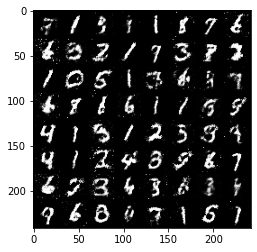

  2%|▏         | 2/117 [00:00<00:06, 18.56it/s]

Epoch 155 of 200.
Generator loss: 1.5106 
Discriminator loss: 0.9678


118it [00:06, 19.27it/s]                         


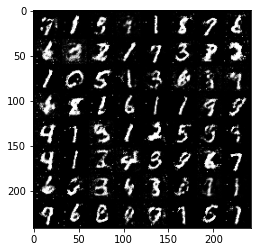

  2%|▏         | 2/117 [00:00<00:06, 18.47it/s]

Epoch 156 of 200.
Generator loss: 1.5097 
Discriminator loss: 0.9684


118it [00:06, 19.28it/s]                         


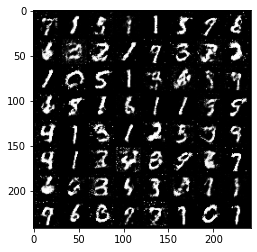

  2%|▏         | 2/117 [00:00<00:06, 18.62it/s]

Epoch 157 of 200.
Generator loss: 1.4762 
Discriminator loss: 0.9900


118it [00:06, 19.26it/s]                         


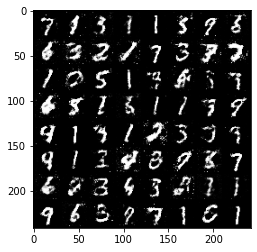

  2%|▏         | 2/117 [00:00<00:06, 18.36it/s]

Epoch 158 of 200.
Generator loss: 1.4944 
Discriminator loss: 1.0075


118it [00:06, 19.29it/s]                         


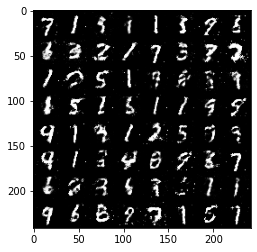

  2%|▏         | 2/117 [00:00<00:06, 18.31it/s]

Epoch 159 of 200.
Generator loss: 1.4808 
Discriminator loss: 0.9798


118it [00:06, 19.31it/s]                         


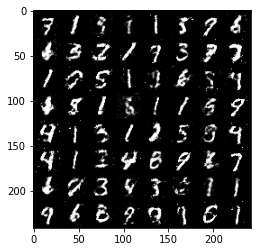

  2%|▏         | 2/117 [00:00<00:06, 18.39it/s]

Epoch 160 of 200.
Generator loss: 1.4539 
Discriminator loss: 0.9826


118it [00:06, 19.27it/s]                         


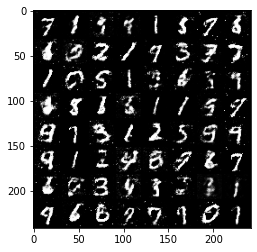

  2%|▏         | 2/117 [00:00<00:06, 18.60it/s]

Epoch 161 of 200.
Generator loss: 1.4498 
Discriminator loss: 0.9991


118it [00:06, 17.74it/s]                         


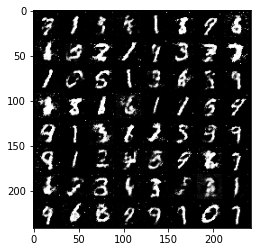

  1%|          | 1/117 [00:00<00:12,  9.62it/s]

Epoch 162 of 200.
Generator loss: 1.4884 
Discriminator loss: 0.9970


118it [00:06, 18.07it/s]                         


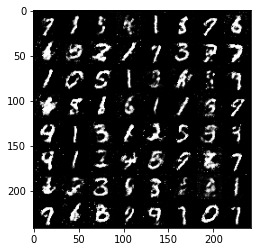

  2%|▏         | 2/117 [00:00<00:06, 18.33it/s]

Epoch 163 of 200.
Generator loss: 1.4279 
Discriminator loss: 1.0040


118it [00:06, 19.11it/s]                         


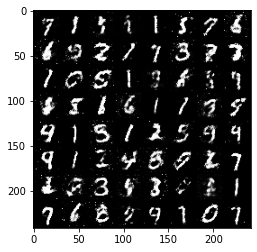

  2%|▏         | 2/117 [00:00<00:06, 18.64it/s]

Epoch 164 of 200.
Generator loss: 1.4109 
Discriminator loss: 1.0048


118it [00:06, 19.22it/s]                         


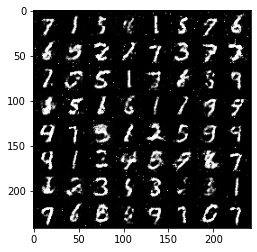

  2%|▏         | 2/117 [00:00<00:06, 18.28it/s]

Epoch 165 of 200.
Generator loss: 1.4092 
Discriminator loss: 1.0089


118it [00:06, 19.13it/s]                         


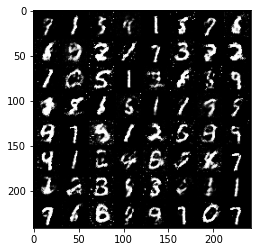

  2%|▏         | 2/117 [00:00<00:06, 18.04it/s]

Epoch 166 of 200.
Generator loss: 1.4863 
Discriminator loss: 0.9949


118it [00:06, 19.20it/s]                         


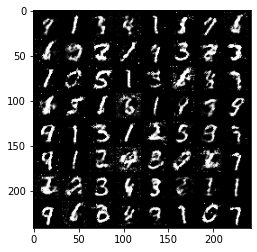

  2%|▏         | 2/117 [00:00<00:06, 18.42it/s]

Epoch 167 of 200.
Generator loss: 1.4022 
Discriminator loss: 1.0107


118it [00:06, 19.29it/s]                         


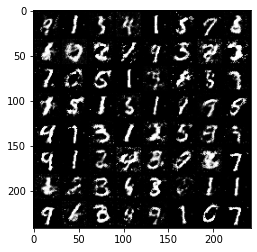

  2%|▏         | 2/117 [00:00<00:06, 18.57it/s]

Epoch 168 of 200.
Generator loss: 1.4237 
Discriminator loss: 1.0324


118it [00:06, 19.23it/s]                         


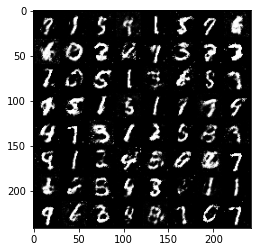

  2%|▏         | 2/117 [00:00<00:06, 18.91it/s]

Epoch 169 of 200.
Generator loss: 1.4176 
Discriminator loss: 1.0219


118it [00:06, 19.48it/s]                         


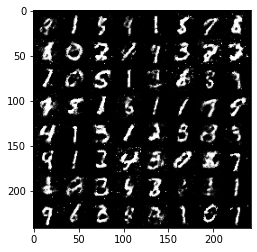

  2%|▏         | 2/117 [00:00<00:06, 19.03it/s]

Epoch 170 of 200.
Generator loss: 1.4395 
Discriminator loss: 0.9992


118it [00:06, 19.66it/s]                         


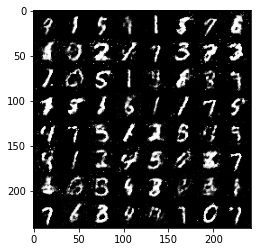

  2%|▏         | 2/117 [00:00<00:05, 19.24it/s]

Epoch 171 of 200.
Generator loss: 1.4307 
Discriminator loss: 1.0179


118it [00:06, 19.36it/s]                         


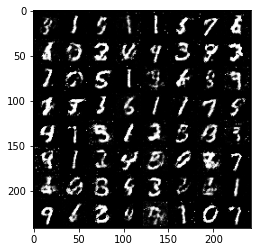

  2%|▏         | 2/117 [00:00<00:06, 18.90it/s]

Epoch 172 of 200.
Generator loss: 1.4209 
Discriminator loss: 1.0185


118it [00:06, 18.58it/s]                         


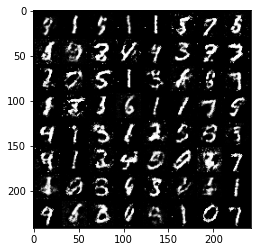

  2%|▏         | 2/117 [00:00<00:06, 18.34it/s]

Epoch 173 of 200.
Generator loss: 1.4068 
Discriminator loss: 1.0190


118it [00:06, 19.18it/s]                         


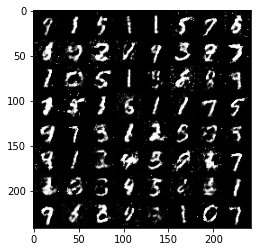

  2%|▏         | 2/117 [00:00<00:06, 18.45it/s]

Epoch 174 of 200.
Generator loss: 1.3669 
Discriminator loss: 1.0407


118it [00:06, 19.07it/s]                         


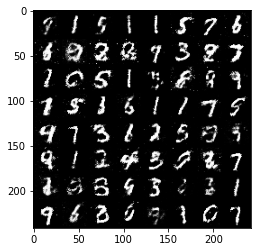

  2%|▏         | 2/117 [00:00<00:06, 18.43it/s]

Epoch 175 of 200.
Generator loss: 1.3734 
Discriminator loss: 1.0329


118it [00:06, 19.19it/s]                         


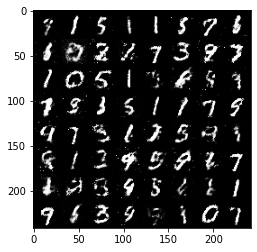

  2%|▏         | 2/117 [00:00<00:06, 18.35it/s]

Epoch 176 of 200.
Generator loss: 1.4567 
Discriminator loss: 1.0314


118it [00:06, 19.24it/s]                         


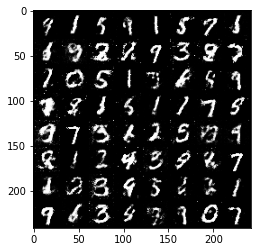

  2%|▏         | 2/117 [00:00<00:06, 18.39it/s]

Epoch 177 of 200.
Generator loss: 1.3820 
Discriminator loss: 1.0590


118it [00:06, 19.02it/s]                         


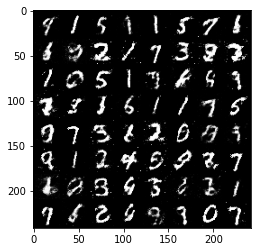

  2%|▏         | 2/117 [00:00<00:06, 18.41it/s]

Epoch 178 of 200.
Generator loss: 1.3359 
Discriminator loss: 1.0380


118it [00:06, 19.12it/s]                         


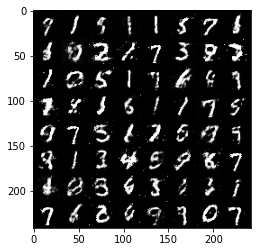

  2%|▏         | 2/117 [00:00<00:06, 18.55it/s]

Epoch 179 of 200.
Generator loss: 1.3911 
Discriminator loss: 1.0400


118it [00:06, 19.20it/s]                         


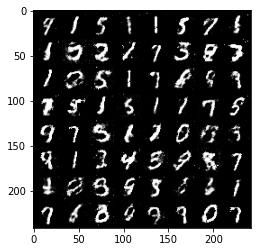

  2%|▏         | 2/117 [00:00<00:06, 18.43it/s]

Epoch 180 of 200.
Generator loss: 1.3992 
Discriminator loss: 1.0420


118it [00:06, 18.55it/s]                         


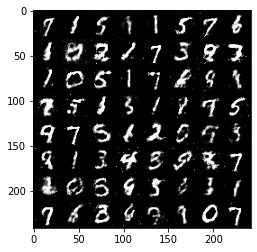

  2%|▏         | 2/117 [00:00<00:06, 17.86it/s]

Epoch 181 of 200.
Generator loss: 1.3546 
Discriminator loss: 1.0409


118it [00:06, 17.46it/s]                         


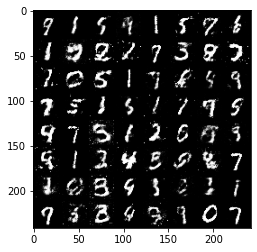

  2%|▏         | 2/117 [00:00<00:06, 18.26it/s]

Epoch 182 of 200.
Generator loss: 1.3943 
Discriminator loss: 1.0270


118it [00:06, 19.22it/s]                         


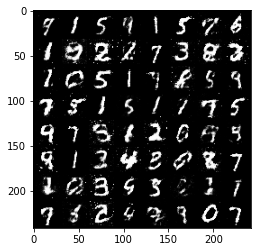

  2%|▏         | 2/117 [00:00<00:06, 18.35it/s]

Epoch 183 of 200.
Generator loss: 1.4141 
Discriminator loss: 1.0364


118it [00:06, 19.08it/s]                         


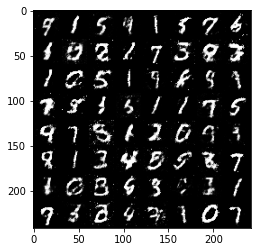

  2%|▏         | 2/117 [00:00<00:06, 18.36it/s]

Epoch 184 of 200.
Generator loss: 1.2882 
Discriminator loss: 1.0755


118it [00:06, 19.18it/s]                         


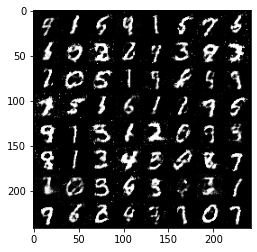

  2%|▏         | 2/117 [00:00<00:06, 18.32it/s]

Epoch 185 of 200.
Generator loss: 1.3800 
Discriminator loss: 1.0318


118it [00:06, 19.18it/s]                         


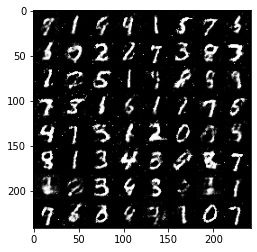

  2%|▏         | 2/117 [00:00<00:06, 18.40it/s]

Epoch 186 of 200.
Generator loss: 1.3217 
Discriminator loss: 1.0583


118it [00:06, 19.06it/s]                         


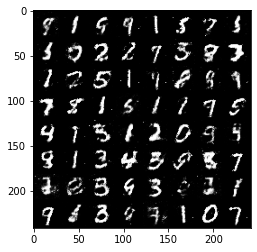

  2%|▏         | 2/117 [00:00<00:06, 18.55it/s]

Epoch 187 of 200.
Generator loss: 1.3262 
Discriminator loss: 1.0536


118it [00:06, 19.26it/s]                         


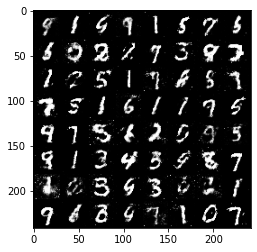

  2%|▏         | 2/117 [00:00<00:06, 18.39it/s]

Epoch 188 of 200.
Generator loss: 1.3909 
Discriminator loss: 1.0443


118it [00:06, 19.27it/s]                         


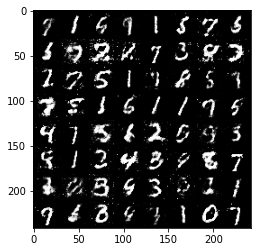

  2%|▏         | 2/117 [00:00<00:06, 18.19it/s]

Epoch 189 of 200.
Generator loss: 1.3496 
Discriminator loss: 1.0427


118it [00:06, 19.29it/s]                         


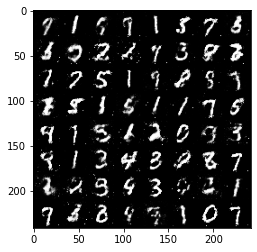

  2%|▏         | 2/117 [00:00<00:06, 18.16it/s]

Epoch 190 of 200.
Generator loss: 1.3307 
Discriminator loss: 1.0574


118it [00:06, 19.26it/s]                         


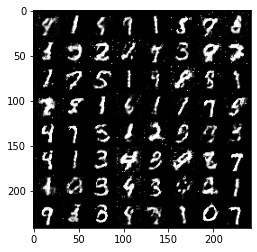

  2%|▏         | 2/117 [00:00<00:06, 18.39it/s]

Epoch 191 of 200.
Generator loss: 1.3841 
Discriminator loss: 1.0409


118it [00:06, 19.21it/s]                         


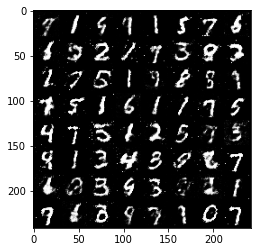

  2%|▏         | 2/117 [00:00<00:06, 18.36it/s]

Epoch 192 of 200.
Generator loss: 1.2877 
Discriminator loss: 1.0682


118it [00:06, 19.20it/s]                         


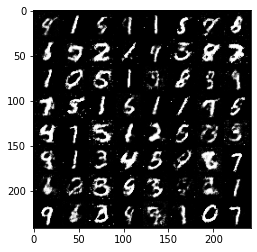

  2%|▏         | 2/117 [00:00<00:06, 18.34it/s]

Epoch 193 of 200.
Generator loss: 1.3891 
Discriminator loss: 1.0412


118it [00:06, 19.08it/s]                         


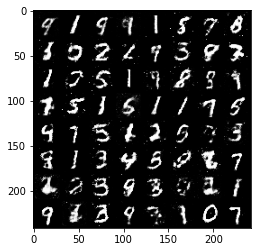

  2%|▏         | 2/117 [00:00<00:06, 18.46it/s]

Epoch 194 of 200.
Generator loss: 1.2864 
Discriminator loss: 1.0814


118it [00:06, 19.20it/s]                         


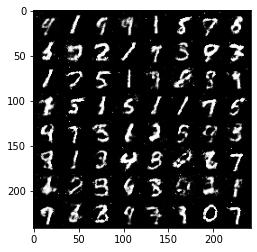

  2%|▏         | 2/117 [00:00<00:06, 18.26it/s]

Epoch 195 of 200.
Generator loss: 1.2979 
Discriminator loss: 1.0782


118it [00:06, 19.17it/s]                         


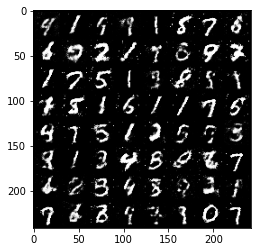

  2%|▏         | 2/117 [00:00<00:06, 18.36it/s]

Epoch 196 of 200.
Generator loss: 1.3178 
Discriminator loss: 1.0658


118it [00:06, 19.12it/s]                         


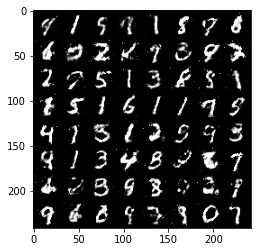

  2%|▏         | 2/117 [00:00<00:06, 18.35it/s]

Epoch 197 of 200.
Generator loss: 1.2730 
Discriminator loss: 1.0899


118it [00:06, 19.25it/s]                         


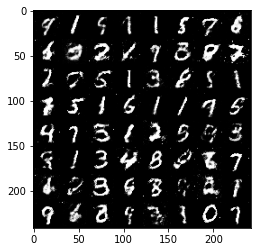

  2%|▏         | 2/117 [00:00<00:06, 18.49it/s]

Epoch 198 of 200.
Generator loss: 1.2735 
Discriminator loss: 1.0906


118it [00:06, 19.19it/s]                         


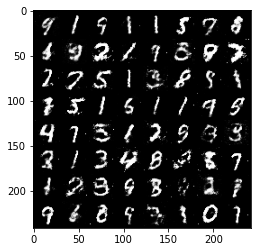

  2%|▏         | 2/117 [00:00<00:06, 18.52it/s]

Epoch 199 of 200.
Generator loss: 1.2726 
Discriminator loss: 1.0730


 32%|███▏      | 38/117 [00:02<00:04, 16.82it/s]

In [ ]:
losses_g = []
losses_d = []
images = []
for epoch in range(epochs):
    loss_g = 0.0
    loss_d = 0.0
    for i, data in tqdm(enumerate(train_loader), total= int(len(train_data)/train_loader.batch_size)):
        image = data[0]
        image = image.to(device)
        b_size = len(image)
        
        for step in range(k):
            data_fake = gen(create_noise(b_size, latent_vector_size)).detach()
            data_real = image
            
            loss_d += train_discriminator(optim_d, data_real, data_fake)
        
        data_fake = gen(create_noise(b_size, latent_vector_size))

        loss_g += train_generator(optim_g, data_fake)

#         print(i)
    with torch.no_grad():
        generated_img = gen(noise).cpu().detach()
        
    grid = make_grid(generated_img,normalize=True)

    plt.imshow(grid.permute(1, 2, 0))
    plt.show()
#     save_generator_image(generated_img, f"../OUTPUTS/gen_img{epoch}.png")
    
    images.append(generated_img)
    
    epoch_loss_g = loss_g/i
    epoch_loss_d = loss_d/i
    
    losses_g.append(epoch_loss_g)
    losses_d.append(epoch_loss_d)
    
    print(f"Epoch {epoch + 1} of {epochs}.")
    print(f"Generator loss: {epoch_loss_g:.4f} \nDiscriminator loss: {epoch_loss_d:.4f}")

In [ ]:
# torch.save(gen.state_dict(), '../OUTPUTS/gen.pth')


In [22]:
imgs = [np.array(to_pil_image(img.squeeze())) for img in images]

In [23]:

imageio.mimsave('../OUTPUTS/gen_images.gif', imgs)

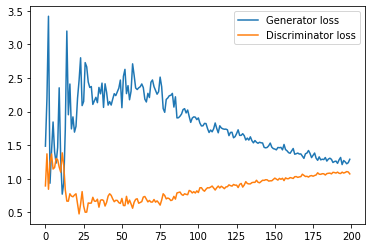

In [13]:
plt.figure()
plt.plot(losses_g, label ='Generator loss')
plt.plot(losses_d, label ='Discriminator loss')
plt.legend()
plt.savefig('../OUTPUTS/loss.png')